In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch.nn as nn
import seaborn as sns
import time
from pandas.plotting import scatter_matrix

# torch
import torch
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torch.autograd import Variable 

# sklearn
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

## Import Data

In [2]:
df_orig = pd.read_csv(
    "../Streamflow_Data/Streamflow_Climate_Data_Subset/inputs_09038500.csv", 
    index_col = "Date", 
    parse_dates=True
)
df_orig.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 15250 entries, 1980-04-01 to 2021-12-31
Data columns (total 46 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   tmmx_mean              15250 non-null  float64
 1   tmmx_var               15250 non-null  float64
 2   tmmn_mean              15250 non-null  float64
 3   tmmn_var               15250 non-null  float64
 4   pr_mean                15250 non-null  float64
 5   pr_var                 15250 non-null  float64
 6   pr_sum                 15250 non-null  float64
 7   SPEI_mean              15007 non-null  float64
 8   SPEI_stdev             15007 non-null  float64
 9   pet_mean               15250 non-null  float64
 10  pet_var                15250 non-null  float64
 11  pet_sum                15250 non-null  float64
 12  SoilM_0_10cm_mean      14885 non-null  float64
 13  SoilM_0_10cm_stdev     14885 non-null  float64
 14  SoilM_10_40cm_mean     14885 non-null

In [3]:
df_orig.describe()

,tmmx_mean,tmmx_var,tmmn_mean,tmmn_var,pr_mean,pr_var,pr_sum,SPEI_mean,SPEI_stdev,pet_mean,...,thresh_10_site,thresh_5_site,thresh_2_site,thresh_30_jd,thresh_20_jd,thresh_10_jd,thresh_5_jd,thresh_2_jd,weibull_jd_07d_avg,weibull_jd_30d_avg
count,15250.000000,15250.000000,15250.000000,15250.000000,15250.000000,15250.000000,15250.000000,15007.000000,15007.000000,15250.000000,...,14610.0,14610.0,1.461000e+04,14610.000000,14610.000000,14610.000000,14610.000000,14610.000000,14610.000000,14610.000000
mean,40.020315,5.997338,37.060315,1.706079,1.686151,1.423220,60.643639,-0.048461,-0.048461,2.815344,...,24.0,16.0,1.490000e+01,75.143217,56.418563,36.020951,21.132320,14.912047,49.298997,49.511586
std,9.511425,2.985877,8.237398,1.438832,2.830731,5.377195,102.030382,0.908254,0.908254,1.643753,...,0.0,0.0,3.758900e-12,35.488000,31.034514,22.546378,9.227395,4.673775,28.827200,28.737325
min,11.100000,0.300000,5.500000,0.200000,0.000000,0.000000,0.000000,-2.090000,-2.090000,0.000000,...,24.0,16.0,1.490000e+01,24.460000,15.840000,14.820000,6.450000,4.700000,0.311526,0.080580
25%,32.100000,3.300000,30.600000,0.800000,0.000000,0.000000,0.000000,-0.680000,-0.680000,1.300000,...,24.0,16.0,1.490000e+01,45.900000,28.200000,16.180000,15.000000,13.000000,24.610592,24.818695
50%,39.800000,6.400000,37.600000,1.300000,0.500000,0.100000,18.900000,-0.050000,-0.050000,2.600000,...,24.0,16.0,1.490000e+01,65.000000,45.280000,26.700000,16.655000,14.000000,49.221184,49.798550
75%,48.800000,8.600000,44.400000,2.100000,2.100000,0.700000,76.575000,0.583000,0.583000,4.200000,...,24.0,16.0,1.490000e+01,105.900000,82.580000,53.160000,23.750000,17.000000,74.143302,74.375504
max,58.300000,22.800000,53.400000,31.200000,38.100000,248.000000,1384.700000,2.090000,2.090000,8.000000,...,24.0,16.0,1.490000e+01,170.300000,124.200000,97.390000,61.715000,44.900000,99.688474,99.919420


In [4]:
df_orig.head(5)

,tmmx_mean,tmmx_var,tmmn_mean,tmmn_var,pr_mean,pr_var,pr_sum,SPEI_mean,SPEI_stdev,pet_mean,...,thresh_10_site,thresh_5_site,thresh_2_site,thresh_30_jd,thresh_20_jd,thresh_10_jd,thresh_5_jd,thresh_2_jd,weibull_jd_07d_avg,weibull_jd_30d_avg
Date,,,,,,,,,,,,,,,,,,,,,
1980-04-01,30.4,7.7,27.5,3.2,0.7,0.2,24.3,NaN,NaN,1.5,...,24.0,16.0,14.9,44.27,38.40,15.28,15.000,15.0,25.545171,24.657534
1980-04-02,31.0,7.7,30.4,3.2,2.5,2.0,89.0,NaN,NaN,1.7,...,24.0,16.0,14.9,46.90,42.04,17.13,15.000,15.0,24.299065,24.899275
1980-04-03,31.0,7.3,30.0,3.7,1.3,0.2,45.1,NaN,NaN,1.8,...,24.0,16.0,14.9,45.90,42.16,16.18,15.030,15.0,27.102804,27.397260
1980-04-04,34.6,6.5,30.7,3.2,0.0,0.0,0.0,0.52,0.52,2.2,...,24.0,16.0,14.9,45.00,40.06,16.06,15.025,15.0,26.168224,27.558421
1980-04-05,37.9,6.6,33.6,2.3,0.0,0.0,0.0,0.60,0.60,2.7,...,24.0,16.0,14.9,45.90,38.38,16.07,15.050,15.0,25.233645,27.639001


## Clean Data

First, let's drop the columns that we know we won't be using for this preliminary LSTM. Explanation for each below:
- "flow_value" - daily streamflow (discharge), "flow_mean_value" - mean daily streamflow: 
    - (Note from Scott) You should only include this if you wanted to test forecasting days ahead, otherwise it would sort of be cheating to include.
- "year", "month", "wy", "jd", "cy": 
    - To start let's only use the index as time indicator for the LSTM. There are obvious issues with this because the time difference between each index is inconsistent, but could be interesting to see how the model performs without specifying that information. 
- "StaID" - guage ID number: 
    - Same for all rows, so unnecessary to include because they don't provide any predictive power.
- "zero_bool", "zero_id", "previous_zeros", "mean_value_prev_zeros": 
    - I honestly have no idea what these are.
- "weibull_jd" - daily variable threshold streamflow percentiles, "weibull_jd_07d_avg" - 7-day variable threshold streamflow percentiles: 
    - We are trying to predict the 30d average of these values, so providing the daily or 7-day average values to the model would be cheating.
- "thresh_30_jd", "thresh_20_jd", "thresh_10_jd", "thresh_5_jd", "thresh_2_jd" - different threshold values for this gauge: 
    - Same for all rows, so unnecessary to include because they don't provide any predictive power.
- "weibull_site" - daily fixed threshold streamflow percentiles, "thresh_30_site", "thresh_20_site", "thresh_10_site", "thresh_5_site", "thresh_2_site": 
    - We are trying to predict the variable threshold streamflow percentiles in this program, so this is data is irrelevant.

In [5]:
df_clean = df_orig.drop(
    ["flow_value", "flow_mean_value", "year", "month", "wy", "jd", "cy", "StaID", "zero_bool", "zero_id", 
     "previous_zeros", "mean_value_prev_zeros", "weibull_jd", "weibull_jd_07d_avg", "thresh_30_jd", 
     "thresh_20_jd", "thresh_10_jd", "thresh_5_jd", "thresh_2_jd", "weibull_site", "thresh_30_site", 
     "thresh_20_site", "thresh_10_site", "thresh_5_site", "thresh_2_site"], 
    axis=1
)
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 15250 entries, 1980-04-01 to 2021-12-31
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tmmx_mean             15250 non-null  float64
 1   tmmx_var              15250 non-null  float64
 2   tmmn_mean             15250 non-null  float64
 3   tmmn_var              15250 non-null  float64
 4   pr_mean               15250 non-null  float64
 5   pr_var                15250 non-null  float64
 6   pr_sum                15250 non-null  float64
 7   SPEI_mean             15007 non-null  float64
 8   SPEI_stdev            15007 non-null  float64
 9   pet_mean              15250 non-null  float64
 10  pet_var               15250 non-null  float64
 11  pet_sum               15250 non-null  float64
 12  SoilM_0_10cm_mean     14885 non-null  float64
 13  SoilM_0_10cm_stdev    14885 non-null  float64
 14  SoilM_10_40cm_mean    14885 non-null  float64
 15  So

Remove rows with no "weibull_jd_30d_avg" value because this is our target variable and we need a labeled output for training.

In [6]:
df_clean = df_clean[df_clean["weibull_jd_30d_avg"].notnull()]
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 14610 entries, 1980-04-01 to 2020-03-31
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tmmx_mean             14610 non-null  float64
 1   tmmx_var              14610 non-null  float64
 2   tmmn_mean             14610 non-null  float64
 3   tmmn_var              14610 non-null  float64
 4   pr_mean               14610 non-null  float64
 5   pr_var                14610 non-null  float64
 6   pr_sum                14610 non-null  float64
 7   SPEI_mean             14607 non-null  float64
 8   SPEI_stdev            14607 non-null  float64
 9   pet_mean              14610 non-null  float64
 10  pet_var               14610 non-null  float64
 11  pet_sum               14610 non-null  float64
 12  SoilM_0_10cm_mean     14610 non-null  float64
 13  SoilM_0_10cm_stdev    14610 non-null  float64
 14  SoilM_10_40cm_mean    14610 non-null  float64
 15  So

Still have some null values present. Let's investigate where these are.

In [7]:
df_clean[df_clean["SWE_mean"].isnull()].index

DatetimeIndex(['1980-04-01', '1980-04-02', '1980-04-03', '1980-04-04',
               '1980-04-05', '1980-04-06', '1980-04-07', '1980-04-08',
               '1980-04-09', '1980-04-10',
               ...
               '1981-09-21', '1981-09-22', '1981-09-23', '1981-09-24',
               '1981-09-25', '1981-09-26', '1981-09-27', '1981-09-28',
               '1981-09-29', '1981-09-30'],
              dtype='datetime64[ns]', name='Date', length=548, freq=None)

In [8]:
df_clean[df_clean["SPEI_mean"].isnull()].index

DatetimeIndex(['1980-04-01', '1980-04-02', '1980-04-03'], dtype='datetime64[ns]', name='Date', freq=None)

The null values are mostly within the "SWE_mean" and "SWE_stdev" variables (there are a few in the "SPEI_mean" and "SPEI_stdev" variables as well, but they overlap with the nulls from the other SWE variables so they will be solved along with the SWE nulls) and are all within the first 2 years of data collection. Considering how much data we have let's just drop thesee rows to start. If we find out later that these variables hold a lot of predictive power we can look into maintaining this information for the final LSTM.

In [9]:
df_clean = df_clean[df_clean["SWE_mean"].notnull()]
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 14062 entries, 1981-10-01 to 2020-03-31
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tmmx_mean             14062 non-null  float64
 1   tmmx_var              14062 non-null  float64
 2   tmmn_mean             14062 non-null  float64
 3   tmmn_var              14062 non-null  float64
 4   pr_mean               14062 non-null  float64
 5   pr_var                14062 non-null  float64
 6   pr_sum                14062 non-null  float64
 7   SPEI_mean             14062 non-null  float64
 8   SPEI_stdev            14062 non-null  float64
 9   pet_mean              14062 non-null  float64
 10  pet_var               14062 non-null  float64
 11  pet_sum               14062 non-null  float64
 12  SoilM_0_10cm_mean     14062 non-null  float64
 13  SoilM_0_10cm_stdev    14062 non-null  float64
 14  SoilM_10_40cm_mean    14062 non-null  float64
 15  So

No more null values!

In [10]:
df = df_clean

## Data Exploration

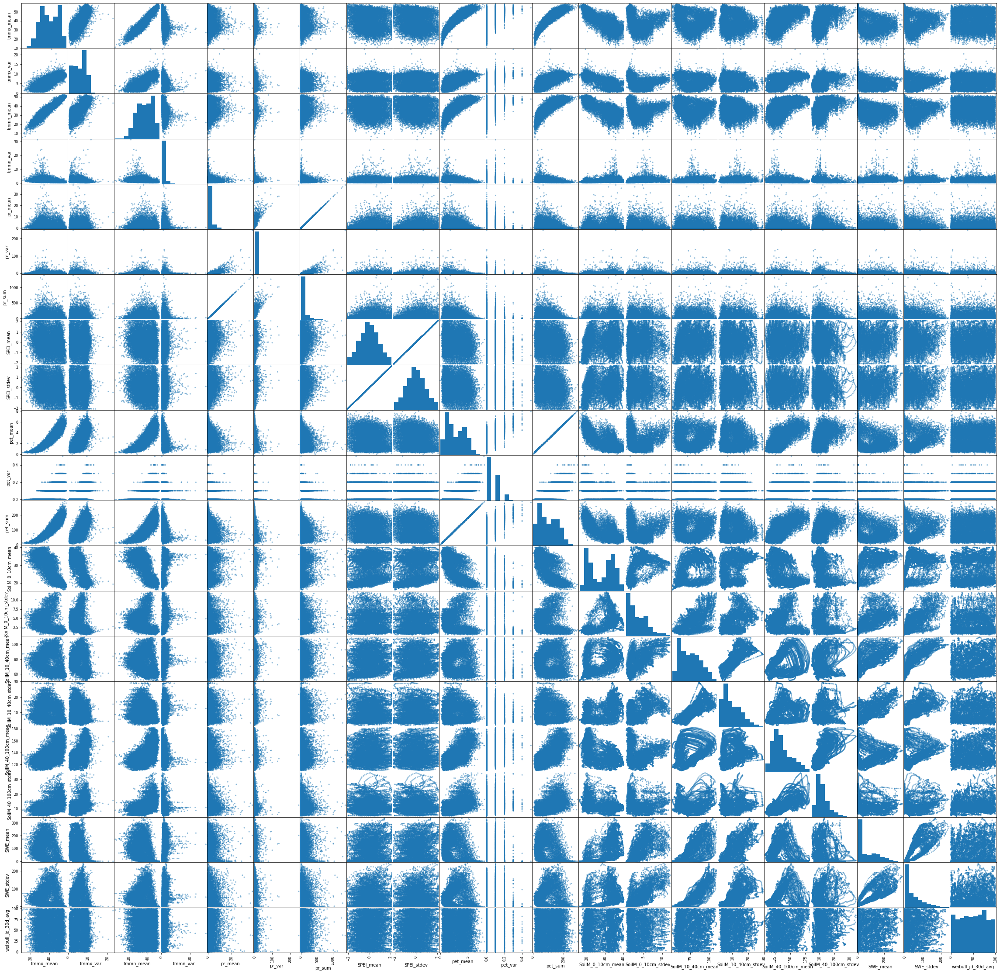

In [11]:
scatter_matrix(df, figsize=(40,40))
plt.show()

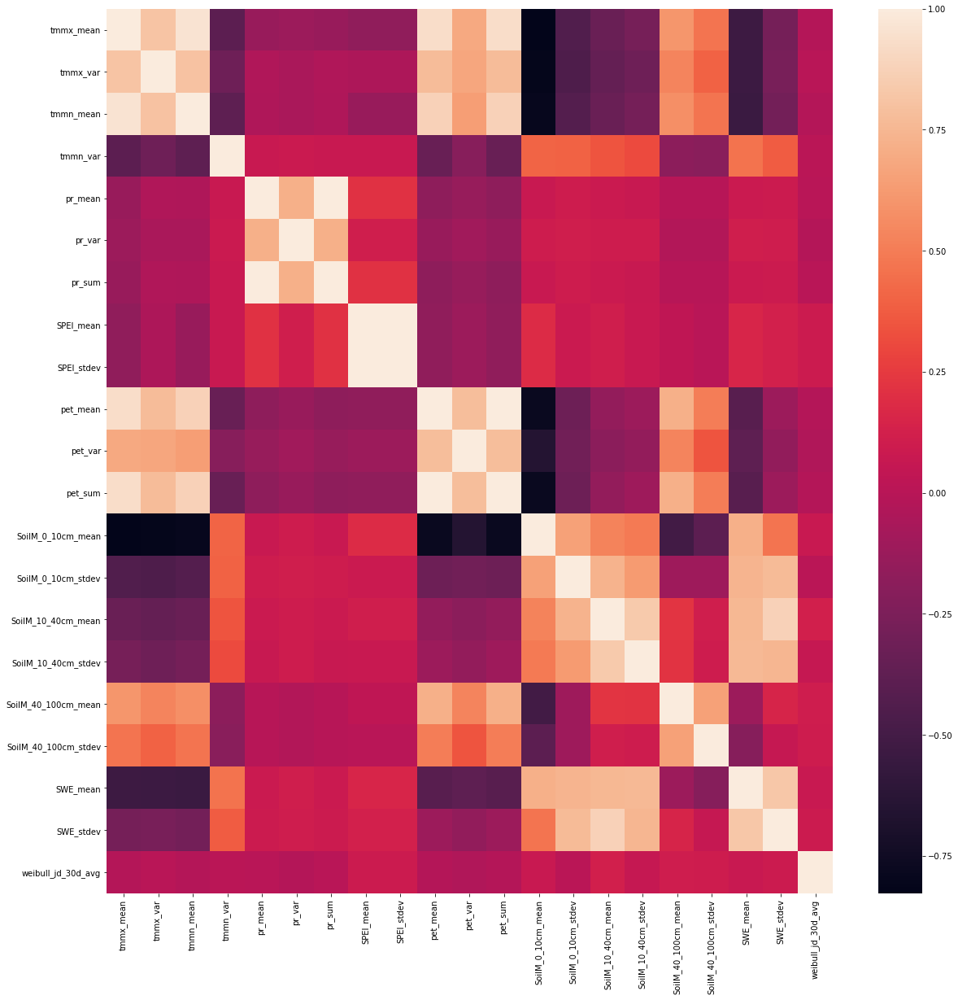

In [12]:
corr_matrix = df.corr()

f, ax = plt.subplots(figsize=(20, 20))
ax = sns.heatmap(corr_matrix)
ax = plt.rcParams.update({'font.size': 15})
plt.show()

Great! No obvious high correlation between any of our feature variables and our target variable, "weibull_jd_30d_avg".

Interesting Takeaways:
- daily temp variables, tmmx and tmmn (except "tmmn_var"), highly correlated with evapotranspiration variables, pet
- as soil depth increases, correlation with pet and tmm variables increases
- as soil depth increases, correlation with SWE variables decreases

Each pair item likely contains same information as the other pair item, but for this preliminary LSTM we will leave them:
- "pr_mean" and "pr_sum" extremely correlated with each other
- "SPEI_mean" and "SPEI_stdev" extremely correlated with each other

The following variables were found to be skewed:
- "tmmx_var"
- "tmmn_var"
- "pr_mean"
- "pr_var"
- "pr_sum"

However, log transforming will only be done on the temperature values because the precipitation values should have many 0's due to days that it didn't rain. We don't want to lose the 0 baseline that we have for our precipitation features. The temperature variables on the other hand would be smoothed out by the transformation, making them more evenly distributed.

In [13]:
# Add log transformed versions of selected variables
df.insert(
    loc=df.columns.get_loc("tmmx_var"),
    column="log_tmmx_var",
    value=np.log10(df["tmmx_var"])
)
df.insert(
    loc=df.columns.get_loc("tmmn_var"),
    column="log_tmmn_var",
    value=np.log10(df["tmmx_var"])
)

# Drop original versions of selected variables
df = df.drop("tmmx_var", axis=1)
df = df.drop("tmmn_var", axis=1)

df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 14062 entries, 1981-10-01 to 2020-03-31
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tmmx_mean             14062 non-null  float64
 1   log_tmmx_var          14062 non-null  float64
 2   tmmn_mean             14062 non-null  float64
 3   log_tmmn_var          14062 non-null  float64
 4   pr_mean               14062 non-null  float64
 5   pr_var                14062 non-null  float64
 6   pr_sum                14062 non-null  float64
 7   SPEI_mean             14062 non-null  float64
 8   SPEI_stdev            14062 non-null  float64
 9   pet_mean              14062 non-null  float64
 10  pet_var               14062 non-null  float64
 11  pet_sum               14062 non-null  float64
 12  SoilM_0_10cm_mean     14062 non-null  float64
 13  SoilM_0_10cm_stdev    14062 non-null  float64
 14  SoilM_10_40cm_mean    14062 non-null  float64
 15  So

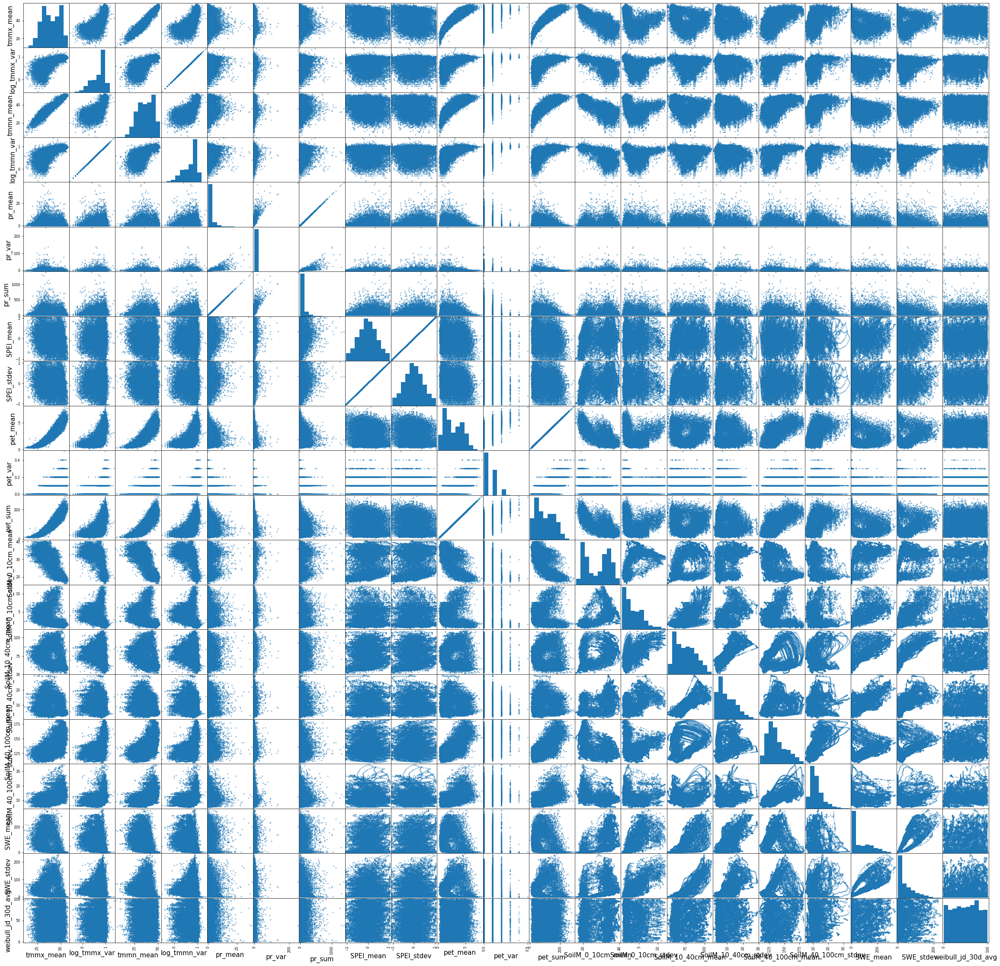

In [15]:
scatter_matrix(df, figsize=(40,40))
plt.show()

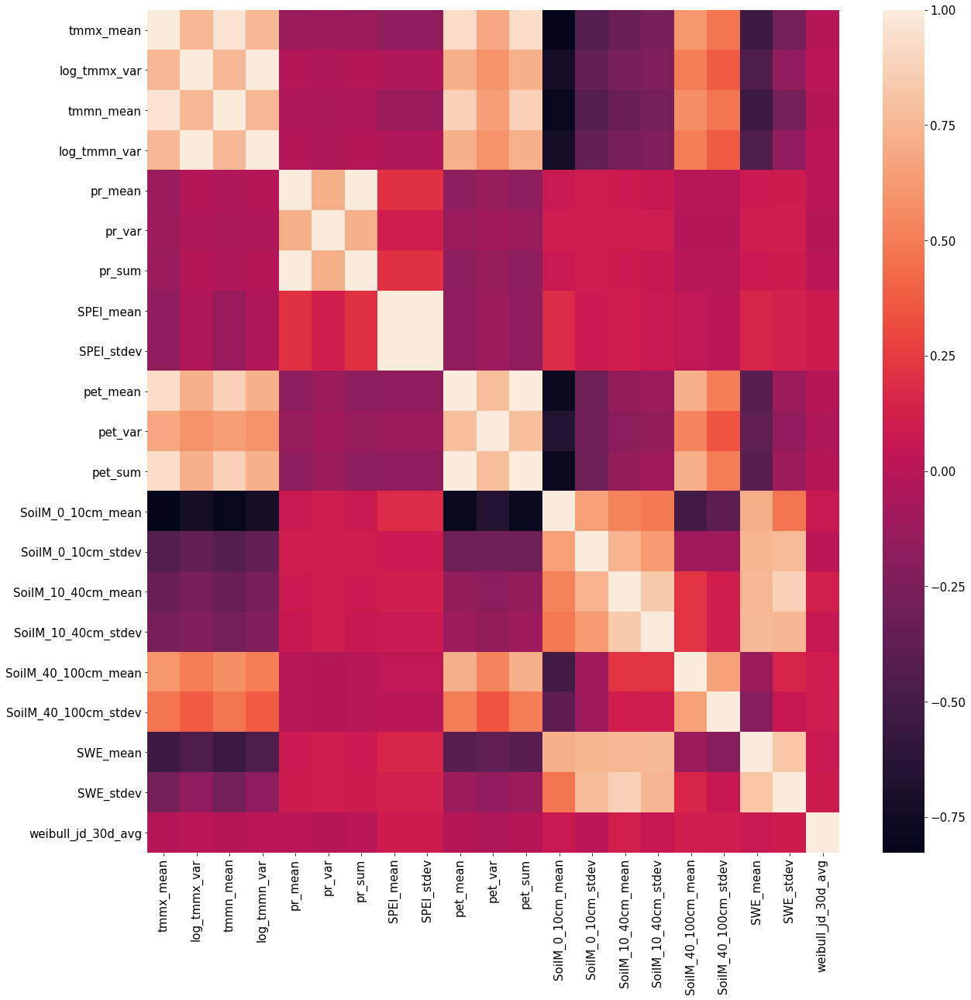

In [16]:
corr_matrix = df.corr()

f, ax = plt.subplots(figsize=(20, 20))
ax = sns.heatmap(corr_matrix)
ax = plt.rcParams.update({'font.size':15})
plt.show()

Lastly, let's visually check for extreme outliers within each variable.

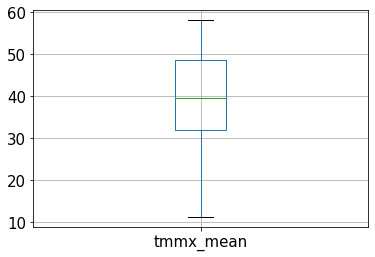

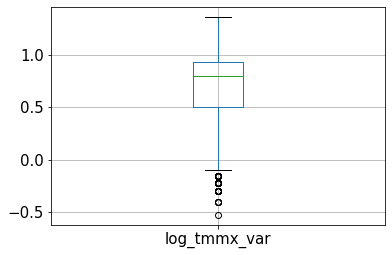

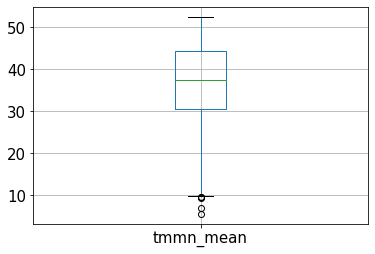

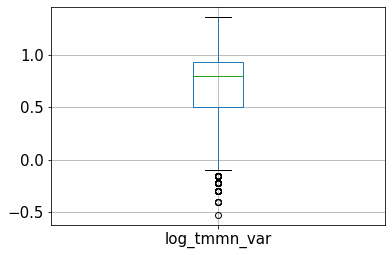

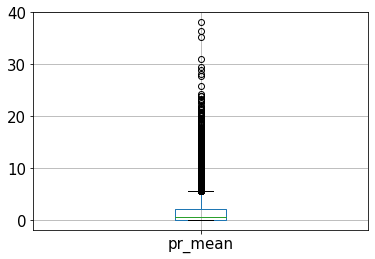

...

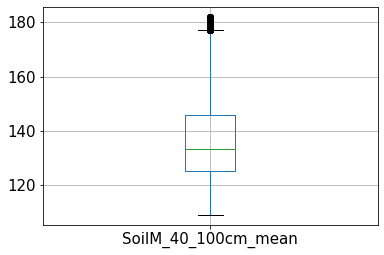

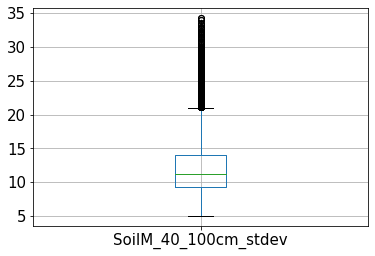

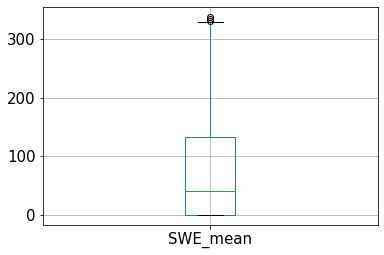

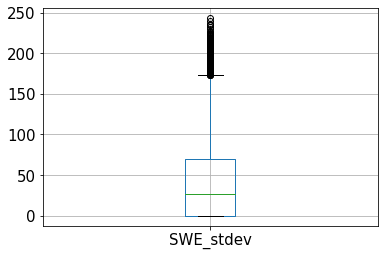

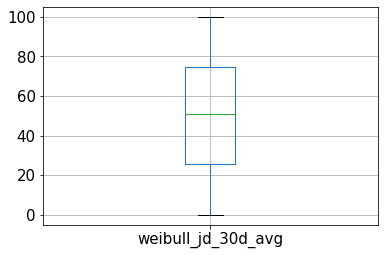

In [17]:
for i in range(0, len(df.columns)):
    df.iloc[:, i:i+1].boxplot()
    plt.show()

There is a pretty large value within the "pr_var" variable, but it's not large enough to warrant to consider an outlier and remove right away.

## Data Pre-Processing

The following pre-processing, model building, and model training steps were inspired by the approach taken by Ahmad Anis in their article "How to apply LSTM using PyTorch". 

Ahmad Anis: https://cnvrg.io/pytorch-lstm/


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 14062 entries, 1981-10-01 to 2020-03-31
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tmmx_mean             14062 non-null  float64
 1   log_tmmx_var          14062 non-null  float64
 2   tmmn_mean             14062 non-null  float64
 3   log_tmmn_var          14062 non-null  float64
 4   pr_mean               14062 non-null  float64
 5   pr_var                14062 non-null  float64
 6   pr_sum                14062 non-null  float64
 7   SPEI_mean             14062 non-null  float64
 8   SPEI_stdev            14062 non-null  float64
 9   pet_mean              14062 non-null  float64
 10  pet_var               14062 non-null  float64
 11  pet_sum               14062 non-null  float64
 12  SoilM_0_10cm_mean     14062 non-null  float64
 13  SoilM_0_10cm_stdev    14062 non-null  float64
 14  SoilM_10_40cm_mean    14062 non-null  float64
 15  So

Split data into feature variables and target variable.

In [19]:
x = df.iloc[:, :-1]
y = df.iloc[:, -1]

print(x.shape)
print(y.shape)

(14062, 20)
(14062,)


Normalize variables.

In [20]:
ss = StandardScaler()
x_ss = ss.fit_transform(x)

mm = MinMaxScaler()
y = y.to_numpy().reshape(-1, 1)  # MinMaxScaler expects 2D argument
y_mm = mm.fit_transform(y)

Split data into training and test sets.

In [21]:
x_train_init, x_test_init, y_train_init, y_test_init = train_test_split(x_ss, y_mm, test_size=0.25, random_state=42)

print("x_train_init shape = " + str(x_train_init.shape))
print("y_train_init shape = " + str(y_train_init.shape))
print("x_test_init shape = " + str(x_test_init.shape))
print("y_test_init shape = " + str(y_test_init.shape))

x_train_init shape = (10546, 20)
y_train_init shape = (10546, 1)
x_test_init shape = (3516, 20)
y_test_init shape = (3516, 1)


Convert numpy arrays to tensors.

In [22]:
x_train = Variable(torch.Tensor(x_train_init))
x_test = Variable(torch.Tensor(x_test_init))

y_train = Variable(torch.Tensor(y_train_init))
y_test = Variable(torch.Tensor(y_test_init))

print("x_train shape = " + str(x_train.shape))
print("y_train shape = " + str(y_train.shape))
print("x_test shape = " + str(x_test.shape))
print("y_test shape = " + str(y_test.shape))

x_train shape = torch.Size([10546, 20])
y_train shape = torch.Size([10546, 1])
x_test shape = torch.Size([3516, 20])
y_test shape = torch.Size([3516, 1])


Reshape tensors because LSTM cannot handle simple 2D data as input. 

In [23]:
x_train = torch.reshape(x_train, (x_train.shape[0], 1, x_train.shape[1]))
x_test = torch.reshape(x_test, (x_test.shape[0], 1, x_test.shape[1]))

print("x_train shape = " + str(x_train.shape))
print("y_train shape = " + str(y_train.shape))
print("x_test shape = " + str(x_test.shape))
print("y_test shape = " + str(y_test.shape))

x_train shape = torch.Size([10546, 1, 20])
y_train shape = torch.Size([10546, 1])
x_test shape = torch.Size([3516, 1, 20])
y_test shape = torch.Size([3516, 1])


Use torch tensor datasets

In [24]:
train_data = TensorDataset(x_train, y_train)
test_data = TensorDataset(x_test, y_test)

Get data loaders

In [25]:
batch_size = 32
train_loader = DataLoader(train_data, shuffle=True, batch_size=batch_size)
test_loader = DataLoader(test_data, shuffle=False, batch_size=batch_size)

## Model Building

Define the model architecture

In [26]:
class LSTM(nn.Module):
    def __init__(self, num_classes, input_size, hidden_size, num_layers, seq_length):
        super(LSTM, self).__init__()
        self.num_classes = num_classes
        self.num_layers = num_layers
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.seq_length = seq_length
        
        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size,
                          num_layers=num_layers, batch_first=True)
        self.fc_1 =  nn.Linear(hidden_size, 128)
        self.fc = nn.Linear(128, num_classes)

        self.relu = nn.ReLU()
    
    def forward(self, x):
        batch_size = x.shape[0]
        
        # Hidden state
        h_0 = Variable(torch.zeros(self.num_layers, batch_size, self.hidden_size))
        
        # Internal state
        c_0 = Variable(torch.zeros(self.num_layers, batch_size, self.hidden_size))
        
        # Propagate input through LSTM
        output, (hn, cn) = self.lstm(x, (h_0, c_0))
        hn = hn.view(-1, self.hidden_size)
        out = self.relu(hn)
        out = self.fc_1(out)
        out = self.relu(out)
        out = self.fc(out)
        return out

Define the parameters, loss function, and optimizer used

In [27]:
epochs = 100
learning_rate = 0.0003

input_size = x_train.shape[2]
hidden_size = 64
num_layers = 1

num_classes = 1
window_size = 24

In [28]:
lstm = LSTM(num_classes, input_size, hidden_size, num_layers, window_size)

In [29]:
criterion = torch.nn.L1Loss()
optimizer = torch.optim.Adam(lstm.parameters(), lr=learning_rate)

## Model Training

Train the model

In [30]:
train_losses = []
test_losses = []

train_rows = x_train.shape[0]
for epoch in range(epochs):
    epoch_train_losses = []
    
    lstm.train()
    for x, y in train_loader:
        # Forward pass
        outputs = lstm(x) 
        
        # Calculate the gradient
        optimizer.zero_grad()

        # Obtain the loss function
        loss = criterion(outputs, y)
        
        # Calculates the loss of the loss function
        loss.backward() 
        
        # Improve from loss, i.e backprop
        optimizer.step() 
        
        item_loss = loss.item()
        epoch_train_losses.append(item_loss)
    train_loss = np.mean(epoch_train_losses)
    train_losses.append(train_loss)
        
    with torch.no_grad():
        epoch_test_losses = []
        for x, y in test_loader:
            lstm.eval()
            
            # Forward pass
            outputs = lstm(x) 
            
            item_loss = criterion(outputs, y).item()
            epoch_test_losses.append(item_loss)
        test_loss = np.mean(epoch_test_losses)
        test_losses.append(test_loss)
        
        if epoch % 20 == 0 or epoch == (epochs-1):
            print("Epoch: %d | Train Loss: %1.5f | Test Loss: %1.5f" % (epoch, train_loss, test_loss))

Epoch: 0 | Train Loss: 0.27798 | Test Loss: 0.23776
Epoch: 20 | Train Loss: 0.17176 | Test Loss: 0.17792
Epoch: 40 | Train Loss: 0.15454 | Test Loss: 0.16733
Epoch: 60 | Train Loss: 0.14188 | Test Loss: 0.15814
Epoch: 80 | Train Loss: 0.13242 | Test Loss: 0.14979
Epoch: 99 | Train Loss: 0.12504 | Test Loss: 0.14627


## Plotting the Results

In [56]:
# Old transformers
df_x_ss = ss.transform(df.iloc[:, :-1])
df_y_mm = mm.transform(df.iloc[:, -1:])

# Convert to Tensors
df_x_ss = Variable(torch.Tensor(df_x_ss)) 
df_y_mm = Variable(torch.Tensor(df_y_mm))

# Reshape the dataset
df_x_ss = torch.reshape(df_x_ss, (df_x_ss.shape[0], 1, df_x_ss.shape[1]))

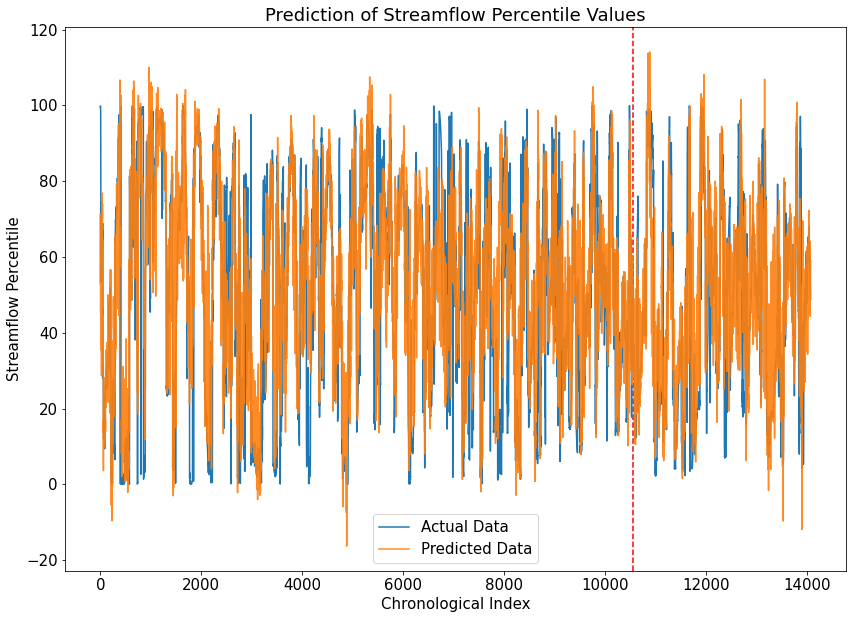

In [62]:
# Find predicted values
train_predict = lstm(df_x_ss)
data_predict = train_predict.data.numpy()

# Finds actual values
data_y_plot = df_y_mm.data.numpy()

# Reverse transformation
data_predict = mm.inverse_transform(data_predict)
data_y_plot = mm.inverse_transform(data_y_plot)

# Plot actual vs. predicted
plt.figure(figsize=(14,10))
plt.axvline(x=x_train.shape[0], c='r', linestyle='--')
plt.plot(data_y_plot, label='Actual Data')
plt.plot(data_predict, label='Predicted Data', alpha=0.9)
plt.title('Prediction of Streamflow Percentile Values')
plt.xlabel("Chronological Index")
plt.ylabel("Streamflow Percentile")
plt.legend()
plt.show() 

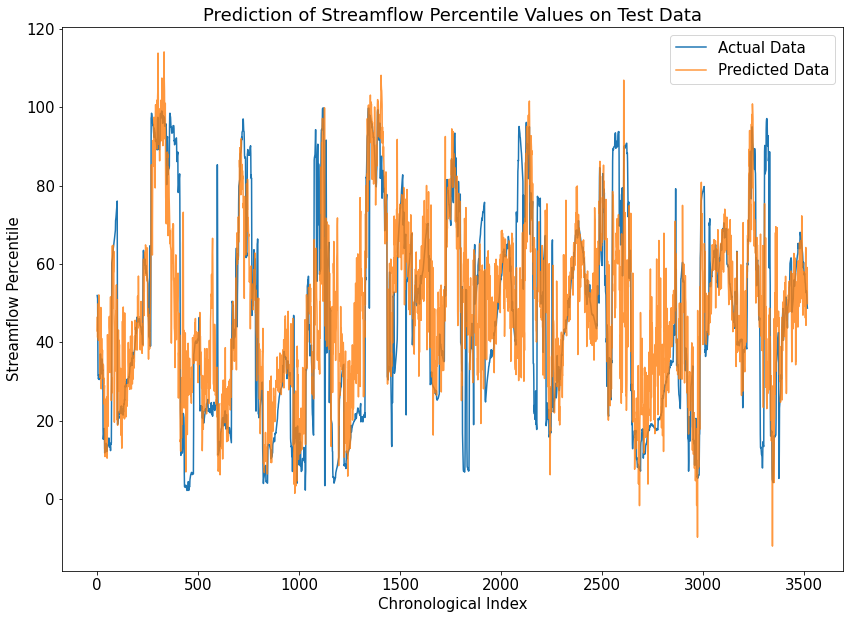

In [60]:
plt.figure(figsize=(14,10))
plt.plot(data_y_plot[x_train.shape[0]:], label='Actual Data')
plt.plot(data_predict[x_train.shape[0]:], label='Predicted Data', alpha=0.8)
plt.title('Prediction of Streamflow Percentile Values on Test Data')
plt.xlabel("Chronological Index")
plt.ylabel("Streamflow Percentile")
plt.legend()
plt.show() 

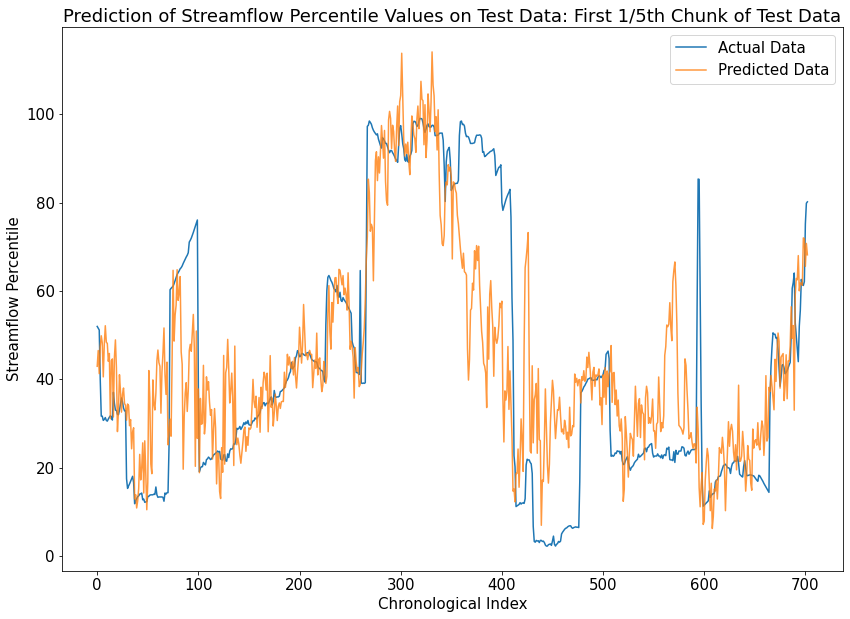

In [74]:
plt.figure(figsize=(14,10))
plt.plot(data_y_plot[x_train.shape[0]:int(x_train.shape[0]+(x_test.shape[0]/5))], label='Actual Data')
plt.plot(data_predict[x_train.shape[0]:int(x_train.shape[0]+(x_test.shape[0]/5))], label='Predicted Data', alpha=0.8)
plt.title('Prediction of Streamflow Percentile Values on Test Data: First 1/5th Chunk of Test Data')
plt.xlabel("Chronological Index")
plt.ylabel("Streamflow Percentile")
plt.legend()
plt.show() 

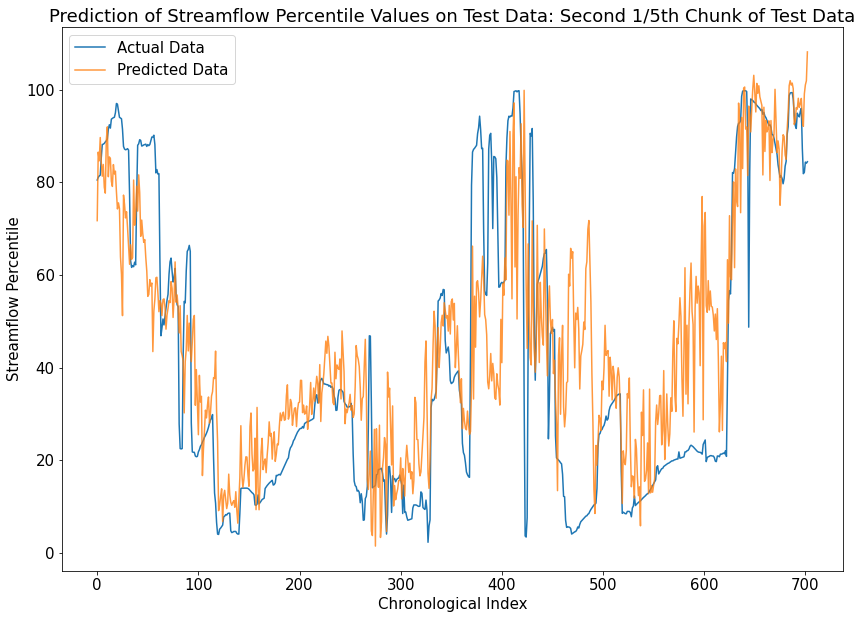

In [75]:
plt.figure(figsize=(14,10))
plt.plot(data_y_plot[int(x_train.shape[0]+((x_test.shape[0]/5))):int(x_train.shape[0]+((x_test.shape[0]/5)*2))], label='Actual Data')
plt.plot(data_predict[int(x_train.shape[0]+((x_test.shape[0]/5))):int(x_train.shape[0]+((x_test.shape[0]/5)*2))], label='Predicted Data', alpha=0.8)
plt.title('Prediction of Streamflow Percentile Values on Test Data: Second 1/5th Chunk of Test Data')
plt.xlabel("Chronological Index")
plt.ylabel("Streamflow Percentile")
plt.legend()
plt.show() 

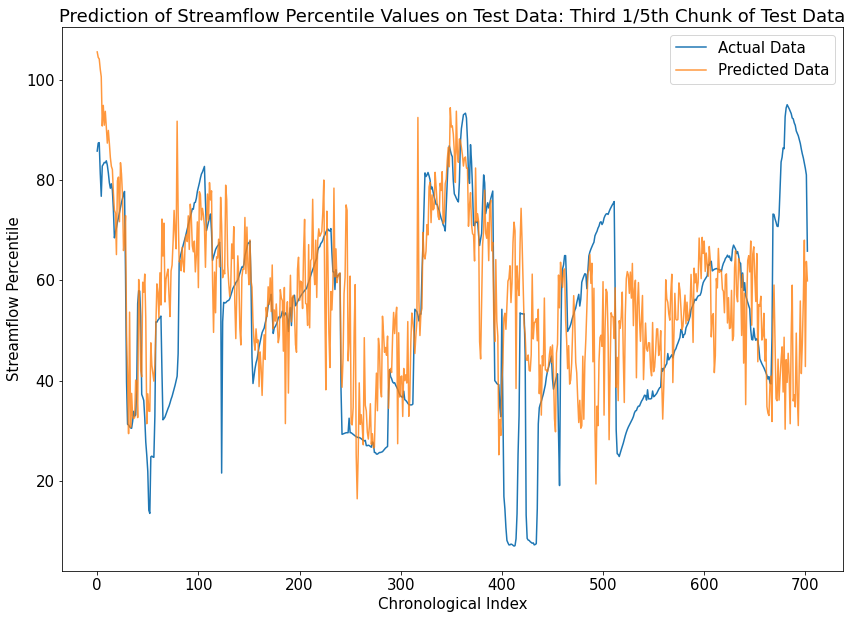

In [76]:
plt.figure(figsize=(14,10))
plt.plot(data_y_plot[int(x_train.shape[0]+((x_test.shape[0]/5)*2)):int(x_train.shape[0]+((x_test.shape[0]/5)*3))], label='Actual Data')
plt.plot(data_predict[int(x_train.shape[0]+((x_test.shape[0]/5)*2)):int(x_train.shape[0]+((x_test.shape[0]/5)*3))], label='Predicted Data', alpha=0.8)
plt.title('Prediction of Streamflow Percentile Values on Test Data: Third 1/5th Chunk of Test Data')
plt.xlabel("Chronological Index")
plt.ylabel("Streamflow Percentile")
plt.legend()
plt.show() 

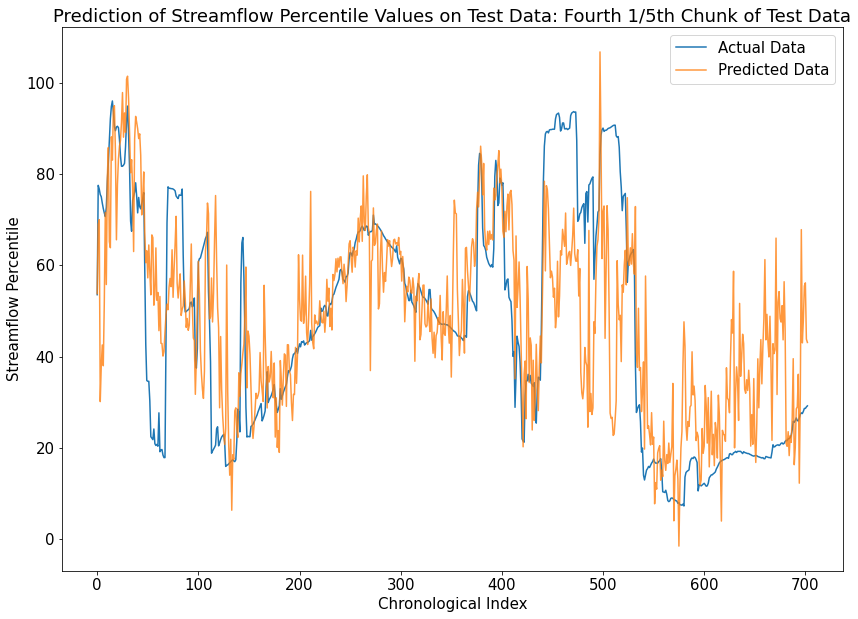

In [77]:
plt.figure(figsize=(14,10))
plt.plot(data_y_plot[int(x_train.shape[0]+((x_test.shape[0]/5)*3)):int(x_train.shape[0]+((x_test.shape[0]/5)*4))], label='Actual Data')
plt.plot(data_predict[int(x_train.shape[0]+((x_test.shape[0]/5)*3)):int(x_train.shape[0]+((x_test.shape[0]/5)*4))], label='Predicted Data', alpha=0.8)
plt.title('Prediction of Streamflow Percentile Values on Test Data: Fourth 1/5th Chunk of Test Data')
plt.xlabel("Chronological Index")
plt.ylabel("Streamflow Percentile")
plt.legend()
plt.show() 

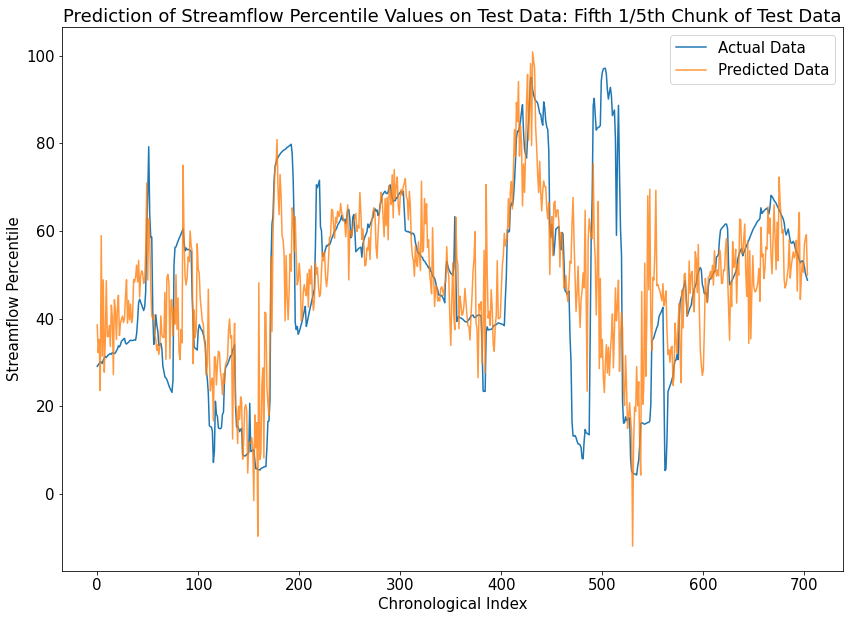

In [78]:
plt.figure(figsize=(14,10))
plt.plot(data_y_plot[int(x_train.shape[0]+((x_test.shape[0]/5)*4)):int(x_train.shape[0]+x_test.shape[0])], label='Actual Data')
plt.plot(data_predict[int(x_train.shape[0]+((x_test.shape[0]/5)*4)):int(x_train.shape[0]+x_test.shape[0])], label='Predicted Data', alpha=0.8)
plt.title('Prediction of Streamflow Percentile Values on Test Data: Fifth 1/5th Chunk of Test Data')
plt.xlabel("Chronological Index")
plt.ylabel("Streamflow Percentile")
plt.legend()
plt.show() 

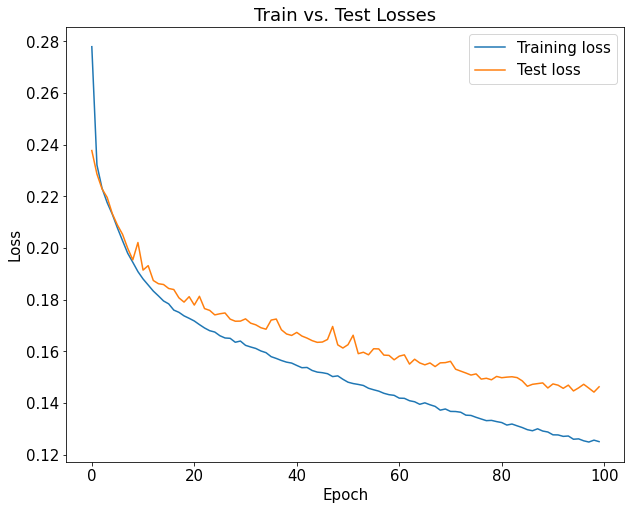

In [47]:
plt.figure(figsize=(10,8))
plt.plot(train_losses, label="Training loss")
plt.plot(test_losses, label="Test loss")
plt.legend()
plt.title("Train vs. Test Losses")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()